### Biel González Garriga NIU:1551813

# EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from IPython.display import display, HTML, IFrame
from pandas_profiling import ProfileReport
from myLibrary.myFunctions import *
from myLibrary.DatasetProcessing import *
import time

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
display(HTML("<style>.container {width:99% !important; }</style>"))

In [4]:
df = pd.read_csv('lol_ranked_games.csv', header=0, delimiter=',')
print("================================\n",
      "\tDataframe loaded\n",
      "================================\n")

 	Dataframe loaded



In [5]:
df,finishedGame_df=preProcessing(df)

 	Basic information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242572 entries, 0 to 242571
Data columns (total 59 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   gameId                   242572 non-null  int64  
 1   gameDuration             242572 non-null  int64  
 2   hasWon                   242572 non-null  int64  
 3   frame                    242572 non-null  int64  
 4   goldDiff                 242572 non-null  int64  
 5   expDiff                  242572 non-null  int64  
 6   champLevelDiff           242572 non-null  float64
 7   isFirstTower             242572 non-null  int64  
 8   isFirstBlood             242572 non-null  int64  
 9   killedFireDrake          242572 non-null  int64  
 10  killedWaterDrake         242572 non-null  int64  
 11  killedAirDrake           242572 non-null  int64  
 12  killedEarthDrake         242572 non-null  int64  
 13  killedElderDrake         242572 non-nu

In [6]:
profile = ProfileReport(df,
                        title="Expanded LoL games data profiling report",
                        correlations=None,
                        interactions={"continuous":False},
                        missing_diagrams={"bar":False},
                       )
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Informació del Pandas Report del dataframe despres del feature enginieering

Observacions: Les variables originals i el nombre de files que hi ha no ha canviat, per tant podem analitzar el dataframe base també des d'aquest expandit i així es farà una anàlisi completa.

### Informació general

Ens trobem devant d'un dataset del videojoc League of Legends, aquest dataset està compost per multiples sèries temporals de diferents partidas, cada entrada de cada partida es fa en uns frames i conté la informació de cada moment que s'ha pres, aquests frames son iguals per a totes les partides per mantenir consistencia a l'hora de obtenir les dades. Totes les dades son del "blue side", a nivell del joc es el costat que està a la part inferior del mapa. S'ha de tenir en compte que el dataset no conté cap informació dels personatges triats, ni dels personatges "banejats" per cada equip, ni dels objectes comprats. 

Aquí podem veure el mapa on es juguen les partides, aquest es divideix en tres linies o lanes: Top, Mid i Bot, i la jungla per una altra part. Cada equip té a cada linia 3 torres i un inhibidor, mes les dues torres que defenen el nexe, el primer equip que el destrueixi guanya la partida, en el seu defecte si un equip es rendeix guanya l'altra sense necessitat de trencar el nexe:

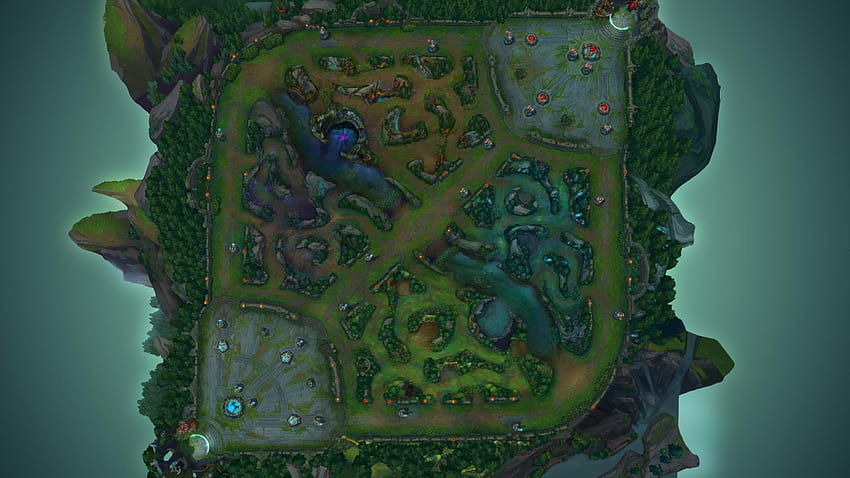

Els atributs s'actualitzen a mesura que s'aconsegueixen objectius com pot ser matar dracs, heralds o barons i també de les estructures. D'igual manera també està enregistrat si ho aconsegueix l'equip enemic. També es manté registre de la diferencia d'experiencia i d'or entre els equips, assassinats, morts i assistencies o de qui ha aconseguit la primera sang. La majoria d'atributs venen dels anteriorment esmentats objectius i estructures.

Aquest dataset no contè nulls i tampoc té atributs categòrics, el que fa més sencill treballar amb aquest dataset. Tot i així s'ha realitzat feature enginieering per augmentar el nombre de informació a visualitzar en l'EDA i millorar les classificacions, ja que l'objectiu que prenem es el de predir si un equip guanyarà o perdrà.

### gameId

Es un id únic per a cada partida, es l'identificador que ens permet diferenciar facilment entre cada partida ja. Es un nombre sencer, més enllà de facilitar que s'agrupi posteriorment la informació que necessitem no ens ajuda massa més.

### gameDuration

Ens mostra per a cada `gameId` quant durarà la partida.És invariable, un nombre sencer i està en milisegons, pot ser un atribut d'interés si volem predir quina serà la duració d'una partida. Però en aquest cas ens centrarem a predir si l'equip blau quanyarà o no la partida.
L'atribut segueix una distribució normal i tot i que hi ha partides més llargues que d'altres no hi ha cap outlier.

### hasWon

Serà l'atribut que triarem com a objectiu. Es un booleà i ens diu si un equip guanya o no. Es important comentar que la distribució tot i que es balancejada no es completament del 50-50. Tot i així fins que no mirem el moment final de totes les partides no podem extreure més conclusions.

### frame

Es l'atribut que ens indica en quin moment de la partida s'ha pres la informació, comença sempre en el minut deu de la partida. Es un nombre sencer i segueix una especie de sigmoide inversa.

### goldDiff i expDiff

Son els atributs que ens indiquen la diferencia d'or i d'experiencia de l'equip blau respecte al roig, si es negatiu van per sota i si es positiu van per sobre. Ambdos segueixen una distribució normal i contenen valors sencers.

### champLevelDiff

Aquest atribut es conseqüencia de l'expDiff, ja que ens dona la diferencia de nivells de l'equip blau. Hi ha molts zeros el que vol dir que no hi ha diferencia de nivell. Segueix una mena de normal tot i que hi ha zones incompletes.

### isFirstTower i isFirstBlood

Ens donen informació de si l'equip blau ha aconseguit destruir la primera torre i la primera sang. Això pot ser important ja que donen una mica d'or extra respecte a la resta de les torres i assassinats aconseguits. Son booleans. Ens hem d'esperar a tenir els moment final de les partides per poder fer una bona anàlisi d'aquests atributs

### killed i lost Drake, BaronNashor o RiftHerald

Ens donen informació de quants dracs, barons o herals ha perdut o aconseguit l'equip blau. Son valors sencers.

### lost i destroyed +Lane + Inhibitor/Tower

Ens donen informació de si s'ha destruit o perdut l'estructura i la posició d'aquesta a la linia en el cas de les torres, son sencers. Cal tenir en compte que no  pot tirar les torres de linia sense destruir l'anterior amb excepció de les del nexe que es poden destruir mentre s'hagi trencat un inhibidor. 
Observació: per qüestions desconegudes els atributs corresponents a BotBaseTurret tenen valors de fins a dos, podria ser que es tingués en consideració les torres que protegeixen el nexe, però no hi ha suficient informació i el creador del dataset al posar la descripció dels atributs no ho va especificar.

### kills, deaths, assists

Contenen el nombre d'assasinats, morts i assistencies de cada equip, son valors sencers. Es pot observar com certs valors es repeteixen més que d'altres ja que aquests despunten a l'histograma.

### wardsPlaced/Destroyed/Lost

Contenen el nombre de wards col·locats, destruïts i que l'equip enemic ha destruït respectivament. Son uns objectes que donen visió d'una zona quan no estàs allà, per tant permeten seguir els moviments dels enemics i preveure situacions abans de que succeeixin. Segueixen majoritariament una distribució logaritmica.


## Enginieered features

### KDA

Conté el ratio de $\frac{kills+assists}{deaths}$, s'ha de tenir en compte que si deaths es zero es comptarà com si fos u. Es un nombre decimal, i podem veure que hi ha un rang de valors molt més comú entre zero i deu.

### visionScore i improvedVisionScore

Ens dona una aproximació de la visió total aconseguida i denegada per l'equip blau. No es igual que la del joc ja que falta informació extra per ponderar be l'utilitat dels wards i poder donar un nombre igual que el del joc, però es una aproximació. Son valors sencers. la improved a part de la suma també conté restada la visió treta per l'enemic.

### lost/destroyed Lane+Turrets

Dona el nombre total de torres destruides i perdudes de l'equip blau a cada linia, es un sencer.

### lost/destroyed Inhibitors

Dona el nombre total de inhibidors destruïts i perduts en total, es un sencer.

### killed/lost ElemDrakes

Dona el nombre total de dracs perduts i aconseguits, es un sencer. Es important ja que aquests dracs donen bonus de moviment o estadistiques a l'equip que els ha aconseguit. Es un sencer.

### obtained/lost DrakeSoul

Ens diu si l'equip ha aconseguit l'anima del drac de la partida o no, es un boolea. Això es important ja que a part del bonus dels propis dracs ens dona una bonificació extra. Es un boolea.

### obtained/lost Type of Drake + DrakeSoul

Ens diu de quin tipus era l'anima del drac de la partida i si l'ha perdut o l'ha guanyat. Es un boolea.

### game + Type of Drake + DrakeSoul

Ens diu quin era el tipus d'anima aconseguida aquella partida per qualsevol dels dos equips. Es un boolea.

### totalKilled/LostObjectives

Ens diu el nombre total d'objectius aconseguits, $Drakes+Nashor+Herald$. Es un sencer.

### totalGameKilledObjectives

Ens diu el nombre d'objectius aconseguits pels dos equips. Es un sencer.

### totalDestroyed/Lost+Towers/Structures

Ens diu el nombre de torres i estructures destruides o perdudes per l'equip blau. Es un sencer.

### totalGameDestroyedStructures

Ens diu el nombre d'estructures destruides pels dos equips, $lost+destroyed$. Es un sencer.

In [7]:
profile = ProfileReport(finishedGame_df,
                        title="Finished LoL games data profiling report",
                        correlations=None,
                        interactions={"continuous":False},
                        missing_diagrams={"bar":False},
                       )
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Informació del Pandas Report sobre el instant final de cada partida

Com ja hem comentat abans els atributs ara mirarem els canvis o informació rellevant que hem obtingut amb els instants finals de la partida.

### hasWon

Podem veure que la proporció es manté pot ser coincidencia o no pero es aquesta la que ens interessarà per fer la classificació. Es un dataset balancejat.

### goldDiff, expDiff i champLevelDiff

Podem veure com ara semblen la suma de dues distribucions normals. Mes endevant explorarem més sobre aquestes formes.

### isFirstTower/Blood

Veiem que l'equip blau obté la gran majoria de les primeres torres i assasinats.

### Drakes, Nashors i Heralds

S'observa que mes o menys les proporcions de dracs,nashors i heralds perduts i aconseguits es mes o menys iguals.

### Inhibidors

Veiem que pocs cops s'arriben a destruir o perdre els inhibidors.

### Torres

S'observa com la majoria de cops de cada linia es destrueixen mes torres que de les que no es destrueix cap. Tot i que es molt més freqüent que en destrueixin o perdin només una torre a mid i a top, mentre que a bot es mes freqüent que se'n destrueixin dues que una, però per poc.

### Drakes

El més normal es que s'obtinguin dos dracs. Tot i que si mirem el nivell de "Souls" que s'aconsegueixien es molt baix, per tant pocs cops arriba una dels dos equips a 4 dracs

### Objectius

Molts cops no s'aconsegueix cap objectiu per part dels dos equips, tot i així es cer que comparat amb la resta de valors veiem que moltes partides s'aconsegueix algun objectiu. A nivell total de partides veiem que pocs cops en una partida no s'aconsegueix cap objectiu.

### Estructures

Semblant als objectius veiem que cap dels dos equips molts cops destrueix cap estructura, tot i així si mirem les estructures total destruides pels dos equips ens fixem que seguüeix una normal. Per tant pot ser que quan un equip tingui molt aventatge el altre no tingui la capacitat de poder destruir les estructures enemigues.

## Gràfics

### Drakes
Aquest objectiu un cop aconseguit dona augments d'estadistiques a l'equip que l'ha aconseguit, quan se n'aconsegueixen quatre s'obte l'anima del tipus de drac elemental que s'hagi matat com a minim dues vegades.

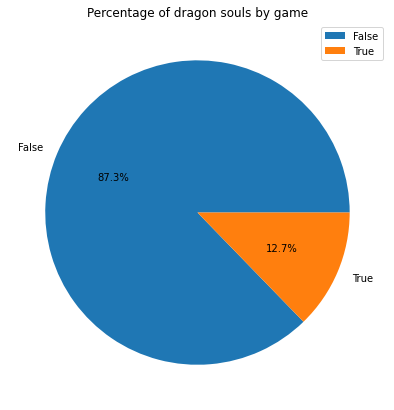

In [8]:
plt.figure(figsize=(7,7))
plt.pie([len(finishedGame_df[finishedGame_df["obtainedDrakeSoul"]==False]),len(finishedGame_df[finishedGame_df["obtainedDrakeSoul"]==True])],
        labels=finishedGame_df["obtainedDrakeSoul"].unique(),autopct='%1.1f%%')
plt.title("Percentage of dragon souls by game")
plt.legend()

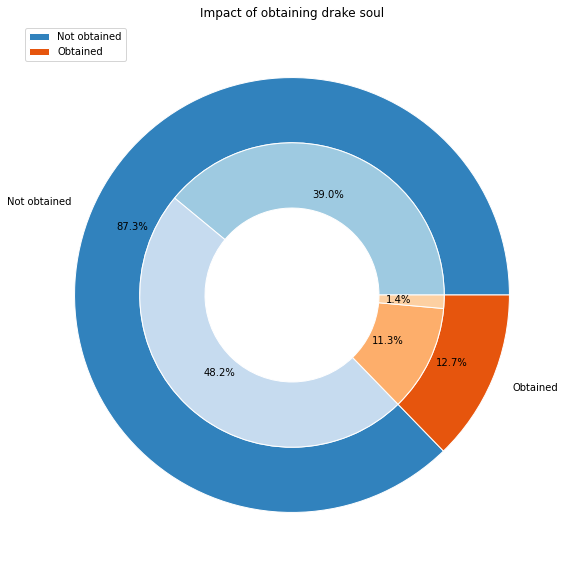

In [9]:
col1='hasWon'
col2='obtainedDrakeSoul'
title='Impact of obtaining drake soul'
labels=["Not obtained","Obtained"]#['No drake Soul','Drake soul']
doublePieWonLost(finishedGame_df,col1,col2,title,labels)

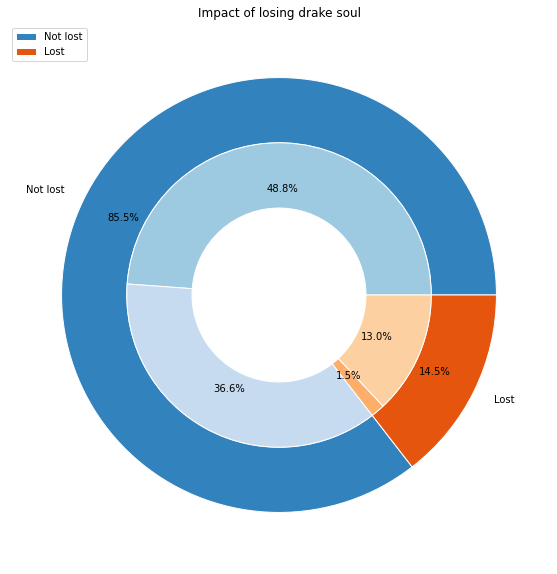

In [10]:
col1='hasWon'
col2='lostDrakeSoul'
title='Impact of losing drake soul'
labels=["Not lost","Lost"]
doublePieWonLost(finishedGame_df,col1,col2,title,labels)

A partir dels grafics anteriors podem observar que son poques les partides a les quals s'obté l'anima del drac, però que quan un dels dos equips l'obté aquesta te un gran impacte a la partida. Podem obseervar que la majoria de cops que l'equip blau l'obté aquest guanya la partida y que quan la perd perd la partida. Això té un impacte a l'hora de jugar ja que s'haurien de prioritzar si volem obtenir o mantenir un aventatge respecte a l'equip enemic.

dict_values([2450, 2512, 2610, 2599])


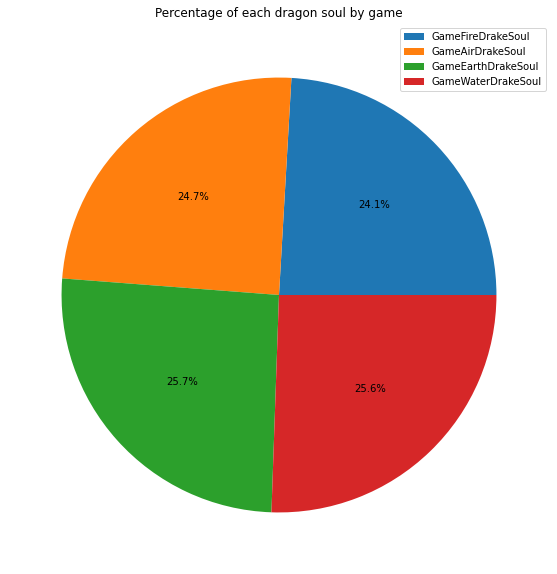

In [11]:
interestCols=['GameFireDrakeSoul','GameAirDrakeSoul','GameEarthDrakeSoul','GameWaterDrakeSoul']
countDict={}
for i in interestCols:
    countDict[i]=finishedGame_df[i].sum()
print(countDict.values())
plt.figure(figsize=(10,10))
plt.pie(countDict.values(),autopct='%1.1f%%')
plt.title("Percentage of each dragon soul by game")
plt.legend(labels=countDict.keys())

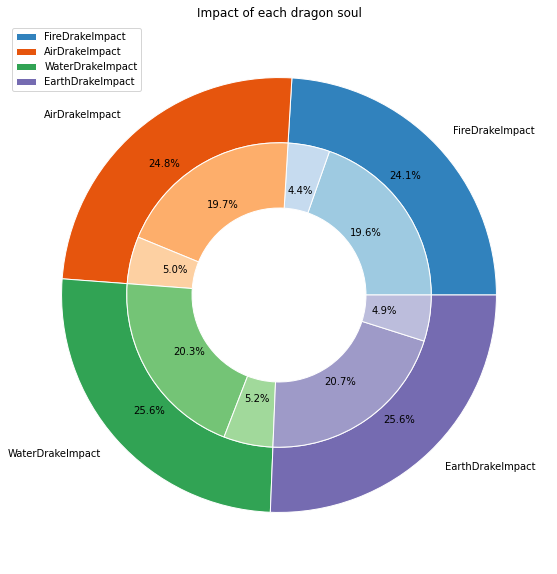

In [12]:
impactDict={'FireDrakeImpact':[0,0],'AirDrakeImpact':[0,0],'WaterDrakeImpact':[0,0],'EarthDrakeImpact':[0,0]}
ObtainedSouls=["obtainedFireDrakeSoul","obtainedAirDrakeSoul","obtainedWaterDrakeSoul","obtainedEarthDrakeSoul"]
LostSouls=["lostFireDrakeSoul","lostAirDrakeSoul","lostWaterDrakeSoul","lostEarthDrakeSoul"]
for i,j,k in zip(impactDict.keys(),ObtainedSouls,LostSouls):
    impactDict[i][0]+=((finishedGame_df['hasWon']==1)&(finishedGame_df[j]==1)).sum()+((finishedGame_df['hasWon']==0)&(finishedGame_df[k]==1)).sum() #Win+Get_Soul & Lose+Lost_Soul(Enemy team soul + they win)
    impactDict[i][1]+=((finishedGame_df['hasWon']==0)&(finishedGame_df[j]==1)).sum()+((finishedGame_df['hasWon']==1)&(finishedGame_df[k]==1)).sum() #Lose+Get_Soul & Win+Lost_Soul(Enemy team soul + they lose) 

fig, ax = plt.subplots(figsize=(10,10))
size = 0.3

vals=np.array(list(impactDict.values()))

cmap = plt.colormaps["tab20c"]
outer_colors = cmap(np.arange(4)*4)
inner_colors = cmap([2,3,6,7,9,10,13,14])

ax.pie(vals.sum(axis=1),radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'),
      labels=impactDict.keys(),autopct='%1.1f%%',
      pctdistance=0.8)

ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'),autopct='%1.1f%%',
      pctdistance=1-size)
ax.legend(impactDict.keys(),loc='upper left')
ax.set(aspect="equal", title='Impact of each dragon soul')
plt.show()

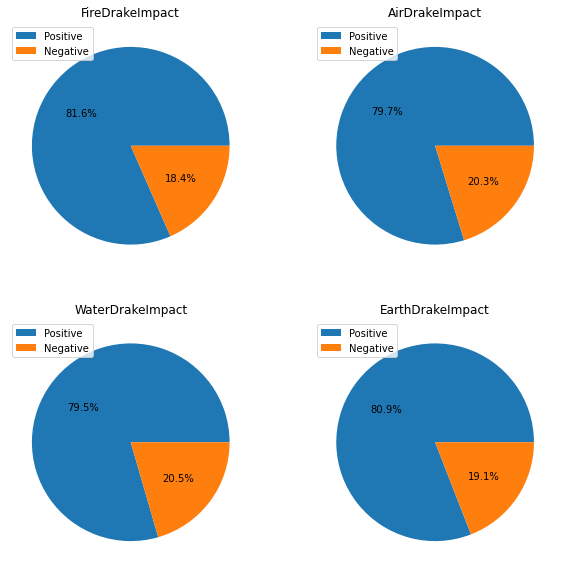

In [13]:
#subplots
fig, axs = plt.subplots(2,2,figsize=(10,10))
ax=axs.flatten()
for i,j in zip(range(0,4),impactDict.keys()):
    ax[i].pie(impactDict[j],autopct='%1.1f%%')
    ax[i].set_title(j)
    ax[i].legend(['Positive','Negative'],loc='upper left')

Aproximadament la proporció de vegades que s'obté una anima de cada drac es d'un de cada quatre cops, no es perfecte del tot. Llavors si ens fixem amb les gràfiques que tenim en l'impacte d'aquests veiem que l'anima del drac de foc dona als dos equips una mica més d'aventatge que la resta d'animes. Es probable que aixó vingui donat per que aquest drac i la seva anima augmenten les capacitats ofensives de l'equip que les obté i per tant redueixi el desaventatge o augmenti molt l'aventatge d'un dels dos equips.

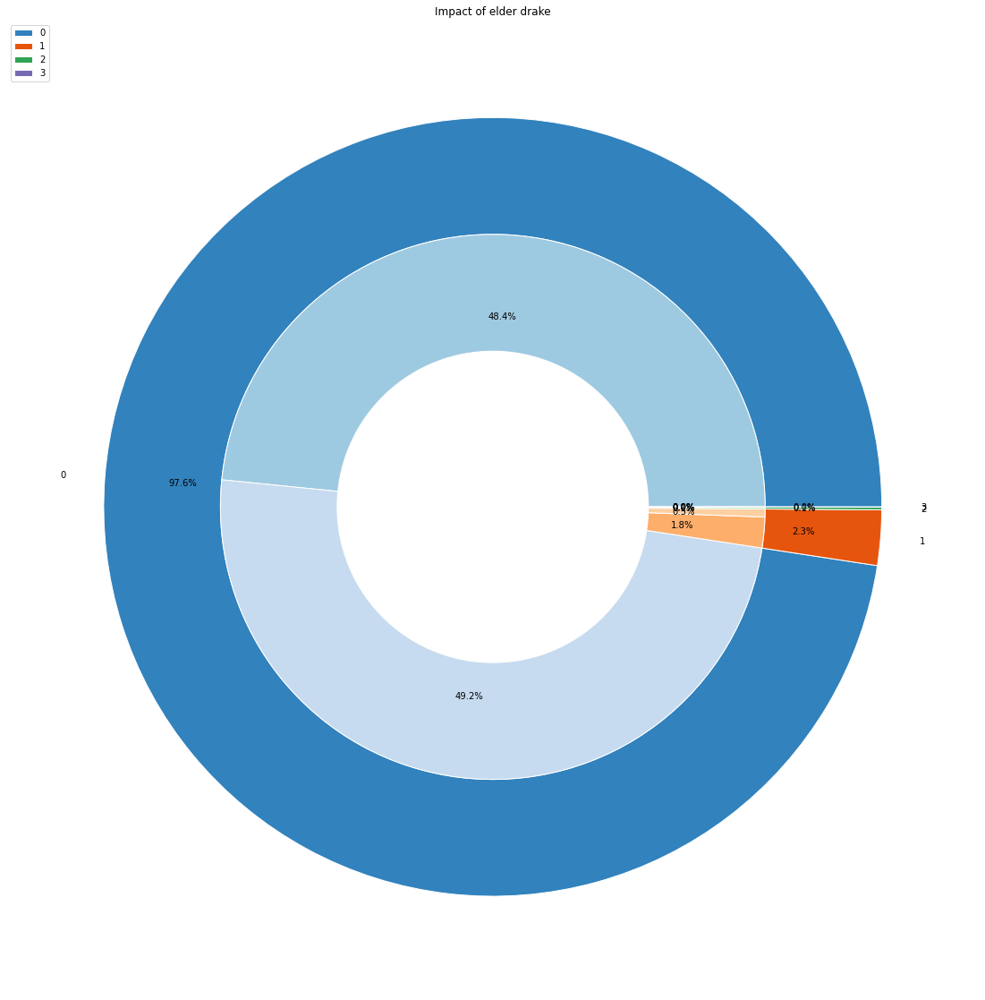

In [14]:
col1='hasWon'
col2='killedElderDrake'
title='Impact of elder drake'
labels=[0,1,2,3]
doublePieWonLost(finishedGame_df,col1,col2,title,labels,(20,20))

El "elder" drake apareix desprñes de que un dels dos equips obtingui l'anima de drac de la partida, aquest no compta per aconseguir cap anima. Aquest dona diverses bonificacions a l'equip que l'aconsegueix, la més important es l'execució d'enemics que estan per sota d'un cert percentatge de vida. Com podem veure al grafic tot i que aquest drac s'obté poc el seu impacte es molt positiu a l'equip que l'obté.

<Figure size 1440x1440 with 0 Axes>

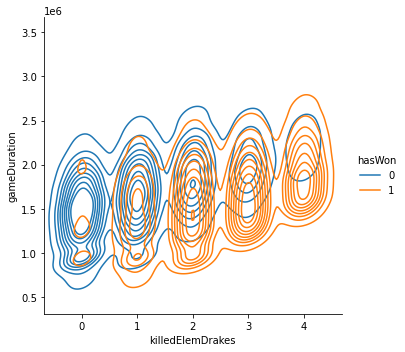

In [15]:
plt.figure(figsize = (20,20))
sns.displot(data = finishedGame_df, x ='killedElemDrakes', y ="gameDuration",
            hue="hasWon", kind="kde")
plt.show()

Podem observar que com més llarga es la partida més probable es que obtinguem dracs, com a minim més de zero i veiem que a les partides més llargues es més probable matar-ne quatre i a més a més guanyar. Ja que si ens fixem a més dracs més probable es que l'equip guanyi.

In [16]:
#Exploracio del primer drac
aux_df=df[(df['killedElemDrakes']==1) | (df["lostElemDrakes"])==1]

In [17]:
aux_df[aux_df.frame.eq(aux_df.groupby('gameId').frame.transform('min'))].describe()

,gameId,gameDuration,hasWon,frame,goldDiff,expDiff,champLevelDiff,isFirstTower,isFirstBlood,killedFireDrake,...,killedElemDrakes,lostElemDrakes,totalKilledObjectives,totalLostObjectives,totalGameKilledObjectives,totalLostTurrets,totalDestroyedTurrets,totalLostStructures,totalDestroyedStructures,totalGameDestroyedStructures
count,2.482400e+04,2.482400e+04,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,...,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000,24824.000000
mean,4.500472e+09,1.660693e+06,0.503062,10.625927,58.495811,-24.442556,-0.007243,0.063729,0.992507,0.121938,...,0.489768,0.510232,0.658597,0.651829,1.310425,0.071302,0.085965,0.072027,0.086932,0.158959
std,5.371542e+07,3.839063e+05,0.500001,1.397599,2684.230085,2115.103335,0.494717,0.244274,0.086238,0.327221,...,0.499905,0.499905,0.629148,0.613855,0.464502,0.333193,0.380430,0.341636,0.389836,0.534088
min,4.357970e+09,5.650000e+05,0.000000,10.000000,-15238.000000,-15537.000000,-3.800000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.460663e+09,1.398000e+06,0.000000,10.000000,-1593.000000,-1332.000000,-0.400000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.528355e+09,1.651000e+06,1.000000,10.000000,49.000000,-21.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.543624e+09,1.912000e+06,1.000000,10.000000,1702.250000,1255.000000,0.200000,0.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,4.547671e+09,3.428000e+06,1.000000,24.000000,15997.000000,15232.000000,3.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,3.000000,3.000000,3.000000,7.000000,8.000000,8.000000,8.000000,8.000000


En aquest describe explorem el primer frame de la partida on s'ha obtingut un drac per a qualsevol dels dos equips. Ens hem de fixar per tant en la columna frame per obtenir la informació que busquem. I veiem que la gran majoria de cops aquest drac s'obté al frame deu de la partida tot i que excepcionalment a vegades es triga més. Aixó ens diu que per als equips obtenir encara que sigui el primer drac es una prioritat. Hem vist a més a més que aquests ens donenen aventatges sobre l'equip enemic i per tant es un element que no volem que s'endugui l'equip enemic si es possible, per tant te tot el sentit del mon que es vagi rapid a obtenir-lo.

<Figure size 2880x1440 with 0 Axes>

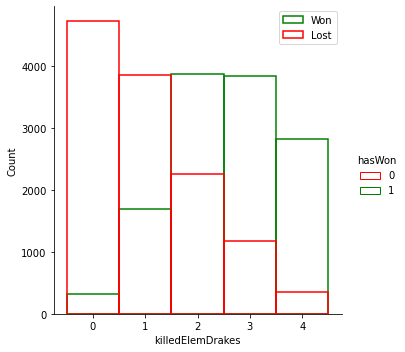

In [18]:
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'killedElemDrakes',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "hist",fill=False,discrete=True )
plt.legend(['Won','Lost'])
plt.show()

Aquí reconfirmem que a més dracs obtinguem més probabilitats hi ha de que guanyem la partida, fins a dos no es clar l'aventatge, pero quan l'equip porta ja tres, o quate, amb quatre obtens l'anima, es veu una clara diferencia entre les derrotes i les victores.

### Baron Nashor
Aquest objectiu dona un augment d'atac i resistencies als minions propers a un membre de l'equip al que pertanyen i tenen activada la passiva que dona l'objectiu.

Error: longitud de labels diferent a de les x
 S'assignaran valors automatics


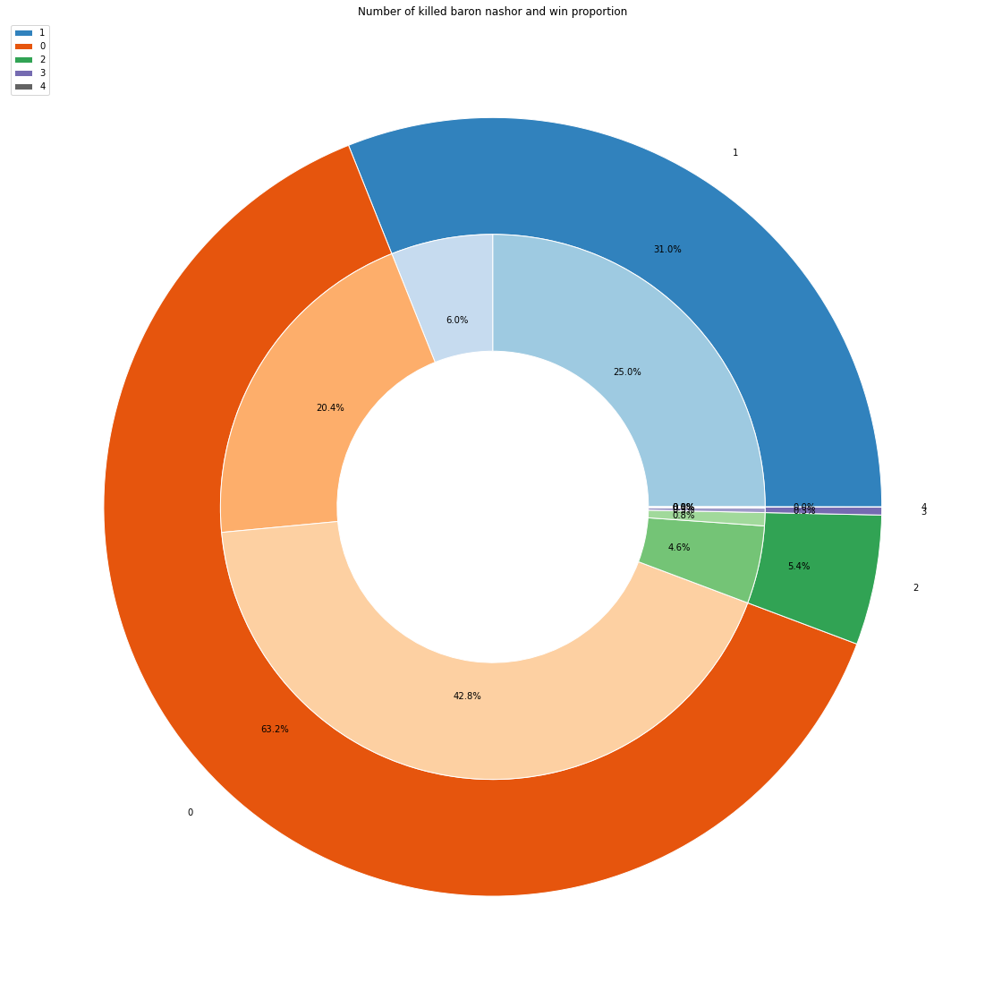

In [19]:
col1='hasWon'
col2='killedBaronNashor'
title='Number of killed baron nashor and win proportion'
doublePieWonLost(finishedGame_df,col1,col2,title,labels,(20,20))

Error: longitud de labels diferent a de les x
 S'assignaran valors automatics


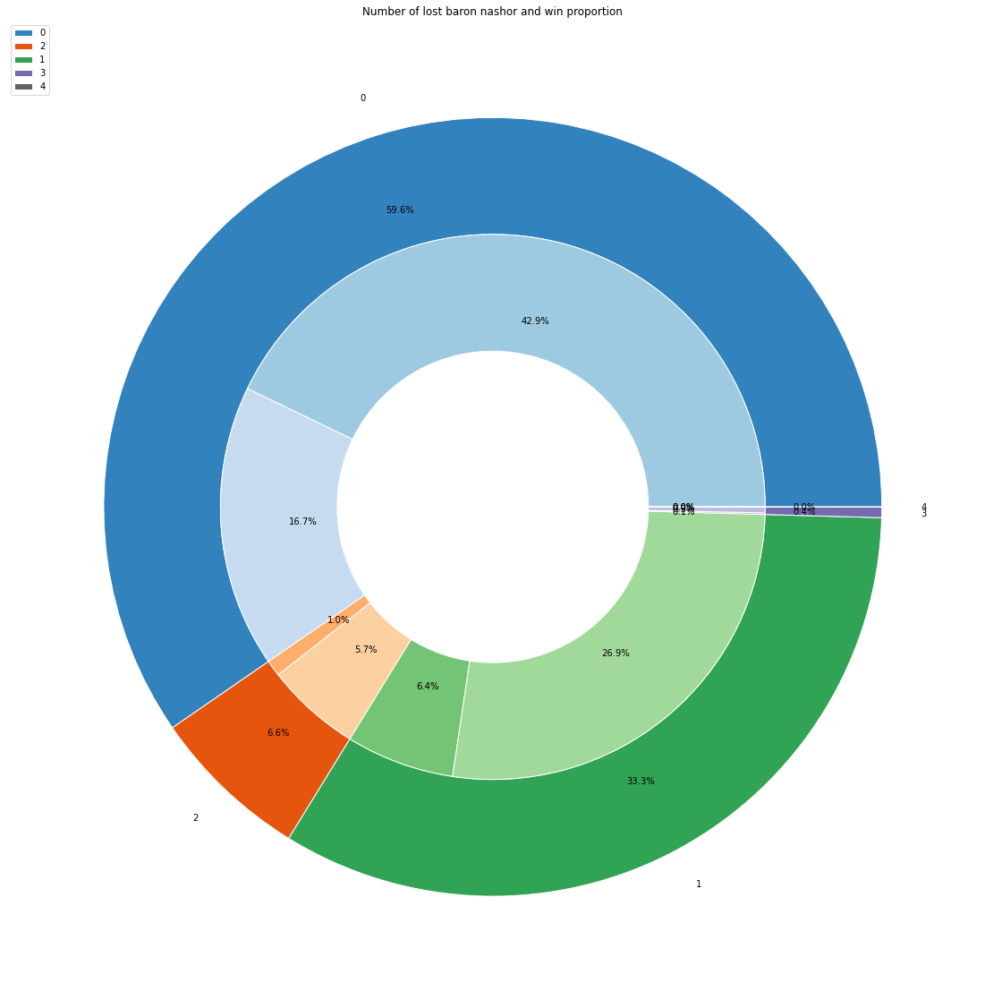

In [20]:
col1='hasWon'
col2='lostBaronNashor'
title='Number of lost baron nashor and win proportion'
doublePieWonLost(finishedGame_df,col1,col2,title,labels,(20,20))

Observem que aquest objectiu en proporcio s'aconsegueix més que l'"elder" drake. Te un impacte positiu en l'equip que l'obté ja que permet avançar més facilment les linies, aconseguir destruir estructures enemigues i per tant més or.

<Figure size 1440x1440 with 0 Axes>

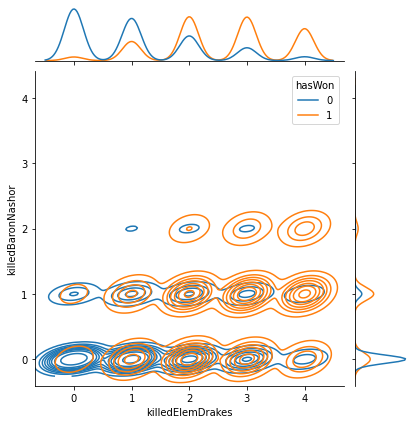

In [21]:
plt.figure(figsize = (20,20))
sns.jointplot(data = finishedGame_df, x ='killedElemDrakes', y ="killedBaronNashor",
            hue="hasWon", kind="kde")
plt.show()

Observem com es molt normal durant una partida obtenir drakes i baron nashor sense cap problema i igualment perdre la partida. Pero observem que a més dracs i més barons obtinguem més probable es que el nostre equip guanyi

<Figure size 1440x1440 with 0 Axes>

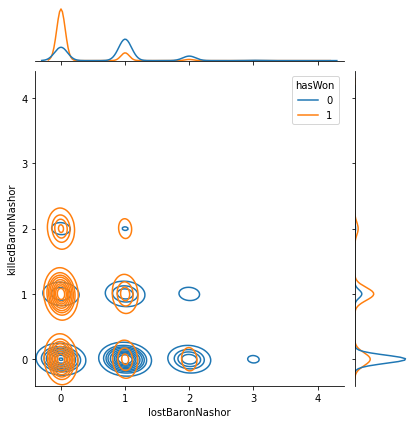

In [22]:
plt.figure(figsize = (20,20))
sns.jointplot(data = finishedGame_df, x ='lostBaronNashor', y ="killedBaronNashor",
            hue="hasWon", kind="kde")
plt.show()

Es veu que en una partida es pot perdre i aconseguir un baron sense problemes tot i que també es veu clarament com que l'equip que en té més es més probable que guanyi la partida.

<Figure size 2880x1440 with 0 Axes>

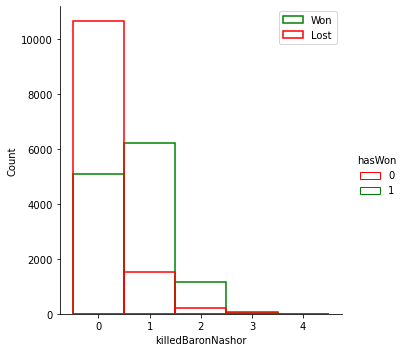

In [23]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'killedBaronNashor',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "hist",fill=False,discrete=True)
plt.legend(['Won','Lost'])
plt.show()
#passat cert punt de vision score win>loss

Aquí confirmem que a partir del primer baron l'augment de les partides guanyades está molt per sobre de les perdudes, això només aconseguint-ne un.

### Vision

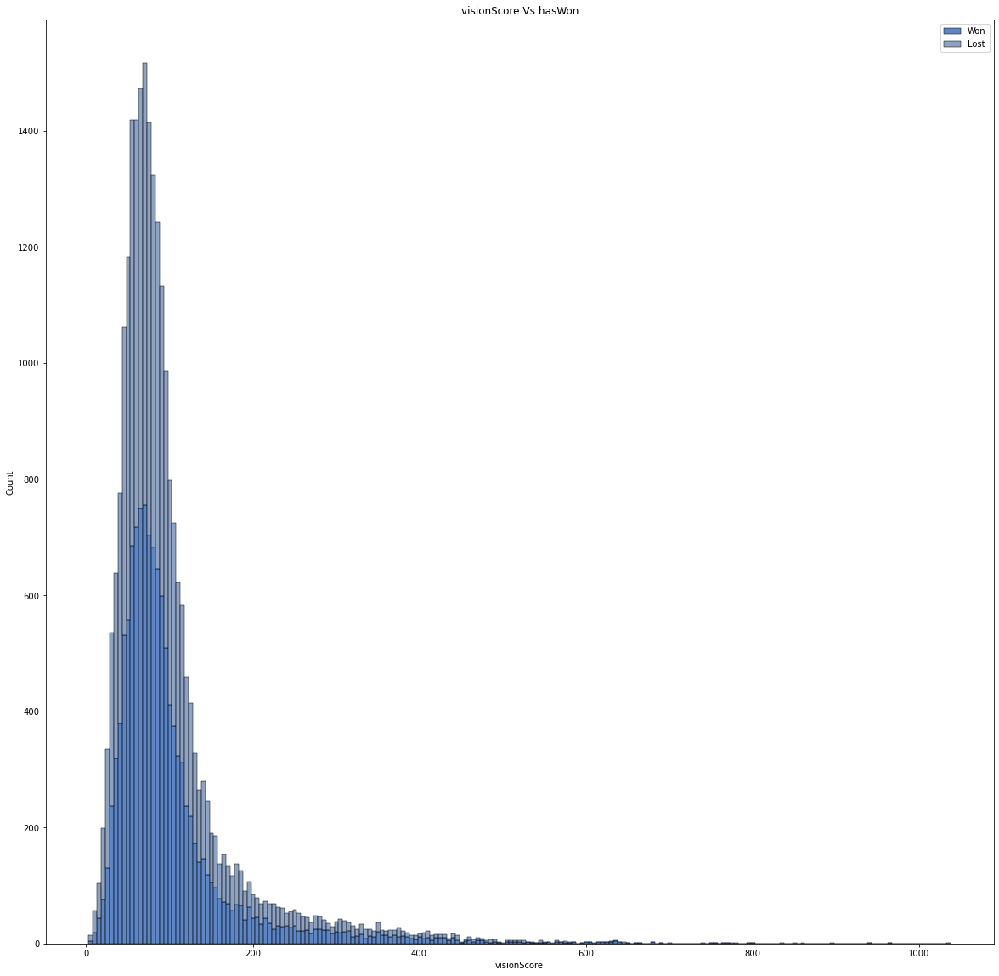

In [24]:
plt.figure(figsize = (20,20))
sns.histplot(data = finishedGame_df, x = 'visionScore',
             hue = "hasWon",binwidth=5,palette = sns.color_palette(['#6883ad','#285cb0'])
             ,multiple = "stack" ).set_title(f"{'visionScore'} Vs hasWon")
plt.legend(['Won','Lost'])
plt.show()

<Figure size 1440x1440 with 0 Axes>

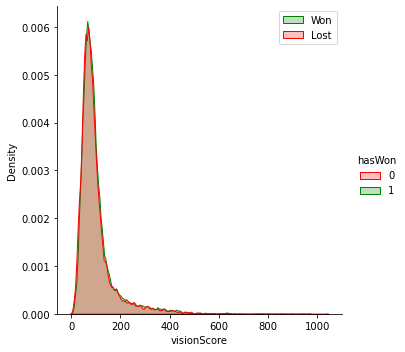

In [25]:
plt.figure(figsize = (20,20))
sns.displot(data = finishedGame_df, x = 'visionScore',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()

<Figure size 1440x1440 with 0 Axes>

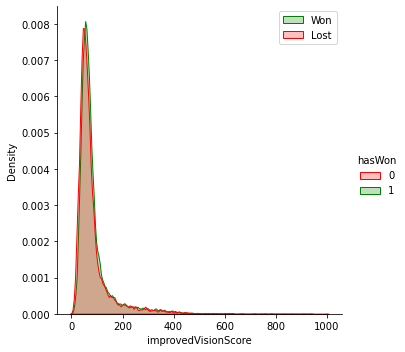

In [26]:
plt.figure(figsize = (20,20))
sns.displot(data = finishedGame_df, x = 'improvedVisionScore',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()

No hi ha grans canvis a l'hora de la visio posada i treta per l'equip blau guanyin o perdin i tampoc si implementem que la visió treta per l'enemic afecti a aquesta puntuació. Per tant no podem extreure massa informació, cosa que esperavem ja que es una aproximació molt bruta de la puntuació de visió real que assigna el joc.

### Gold and Exp diff

<Figure size 1440x1440 with 0 Axes>

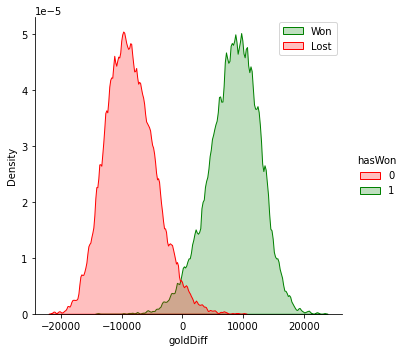

In [27]:
#gold diff
plt.figure(figsize = (20,20))
sns.displot(data = finishedGame_df, x = 'goldDiff',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()
#passat cert punt de vision score win>loss

<Figure size 1440x1440 with 0 Axes>

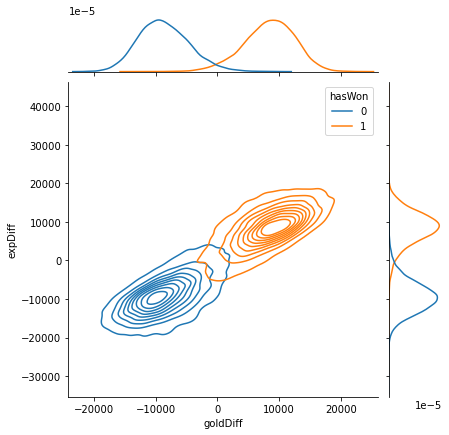

In [28]:
#gold and xp diff

plt.figure(figsize = (20,20))
sns.jointplot(data = finishedGame_df, x = 'goldDiff', y = "expDiff",
            hue="hasWon", kind="kde")
plt.show()

Podem observar clarament com amb una diferencia d'experiencia i or positives es molt més probable guanyar una partida que perdre-la. Així es tant que veiem clarament les dues distribucions normals que abans intuïem amb l'histograma del profiling report. Per tant un dels nostres objectius a les partides pot ser intentar incrementar aquesta diferencia per aconseguir treure encara més aventatge. S'ha de comentar que més or significa més objectes el que significa més passives d'aquests i més estadistiques. L'experiencia ens donarà nivells que també ens milloren les estadistiques i ens permeten augmentar de nivell les habilitats.

#### Petita funció per veure el progrés de la diferencia d'or i experiencia de l'equip blau

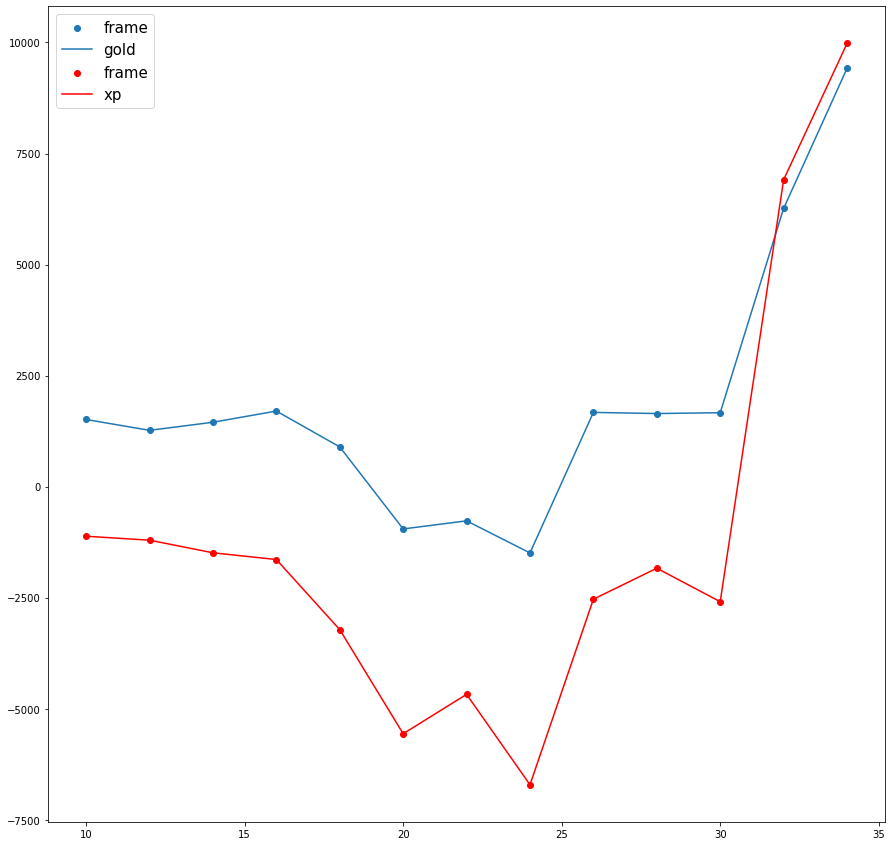

In [29]:
#Canviant el valor de l'index entre 0 i 24912
#Cada cop que es canvii l'index s'ha de reexecutar la cel·la
expAndGoldProgress(df,finishedGame_df['gameId'][6])

<Figure size 1440x1440 with 0 Axes>

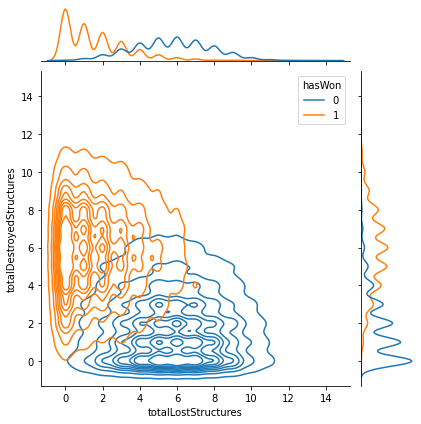

In [30]:
#gold and xp diff

plt.figure(figsize = (20,20))
sns.jointplot(data = finishedGame_df, x ='totalLostStructures', y ="totalDestroyedStructures",
            hue="hasWon", kind="kde")
plt.show()

<Figure size 2880x1440 with 0 Axes>

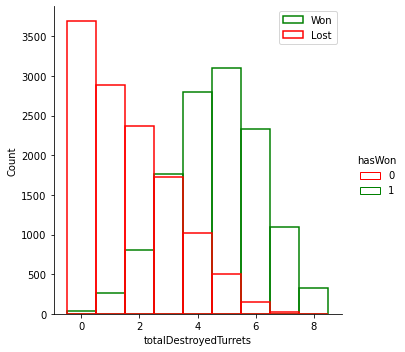

In [31]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'totalDestroyedTurrets',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "hist",fill=False,discrete=True )
plt.legend(['Won','Lost'])
plt.show()

<Figure size 2880x1440 with 0 Axes>

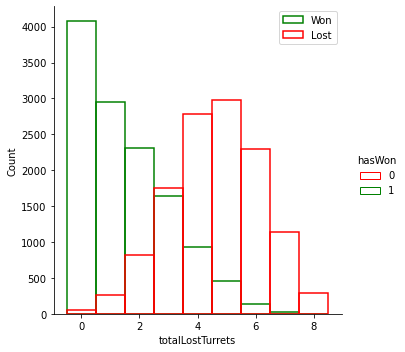

In [32]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'totalLostTurrets',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "hist",fill=False,discrete=True )
plt.legend(['Won','Lost'])
plt.show()

Amb les grafiques anteriors podem veure com l'equip que ha destruit més estructures es més probable que guanyi la partida, tot i que hi ha un intermig també on está bastant equilibrat, pero arribat un cert punt l'aventatge es més que clar.

### Kills, Deaths, Assists, KDA

<Figure size 2880x1440 with 0 Axes>

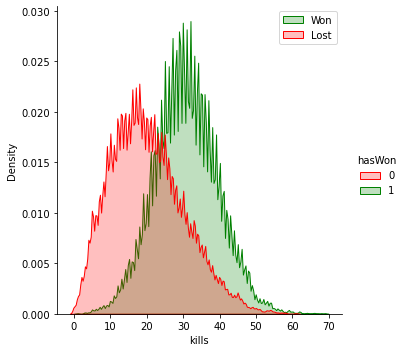

In [33]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'kills',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()

<Figure size 2880x1440 with 0 Axes>

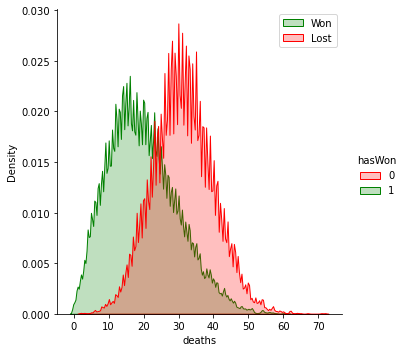

In [34]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'deaths',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()

<Figure size 2880x1440 with 0 Axes>

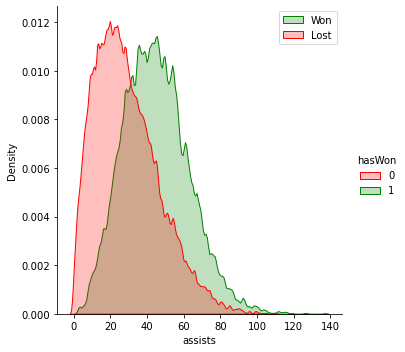

In [35]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'assists',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()

<Figure size 2880x1440 with 0 Axes>

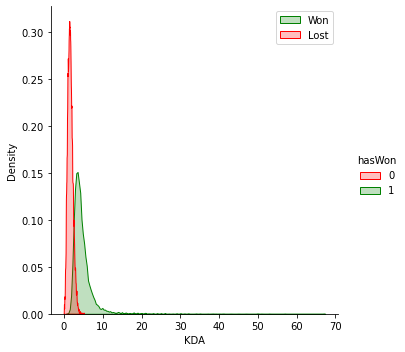

In [36]:
#gold diff
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'KDA',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()
#passat cert punt de vision score win>loss

S'observa que a més kills i assistencies més probable es que l'equip guanyi, tot i així hi ha una gran intersecció on es pot guanyar o perdre, passa el mateix amb les deaths pero a la inversa, ja que aquestes interessa que estiguin baixes. Si mirem el KDA ja es diferencien més facilment les dues zones, veiem que amb un KDA baix és més probable que l'equip perdi la partida i amb un KDA alt la guanyi. Recordem que matar a enemics i aconseguir assistencies dona or i aixó com hem vist abans te un gran impacte.

<Figure size 2880x1440 with 0 Axes>

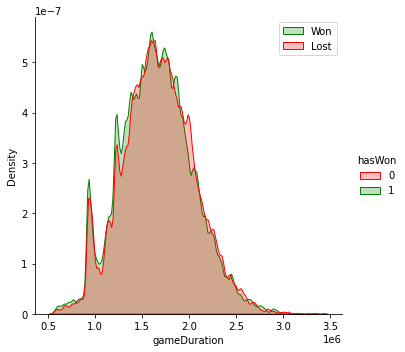

In [37]:
plt.figure(figsize = (40,20))
sns.displot(data = finishedGame_df, x = 'gameDuration',
             hue = "hasWon",palette = sns.color_palette(["red","green"])
             ,kind = "kde",bw_adjust=.25,fill=True )
plt.legend(['Won','Lost'])
plt.show()
#passat cert punt de vision score win>loss

Es veu facilment com la duració de la partida no te cap mena d'impacte ni positiu ni negatiu notable sobre cap dels dos equips.

### Correlacions

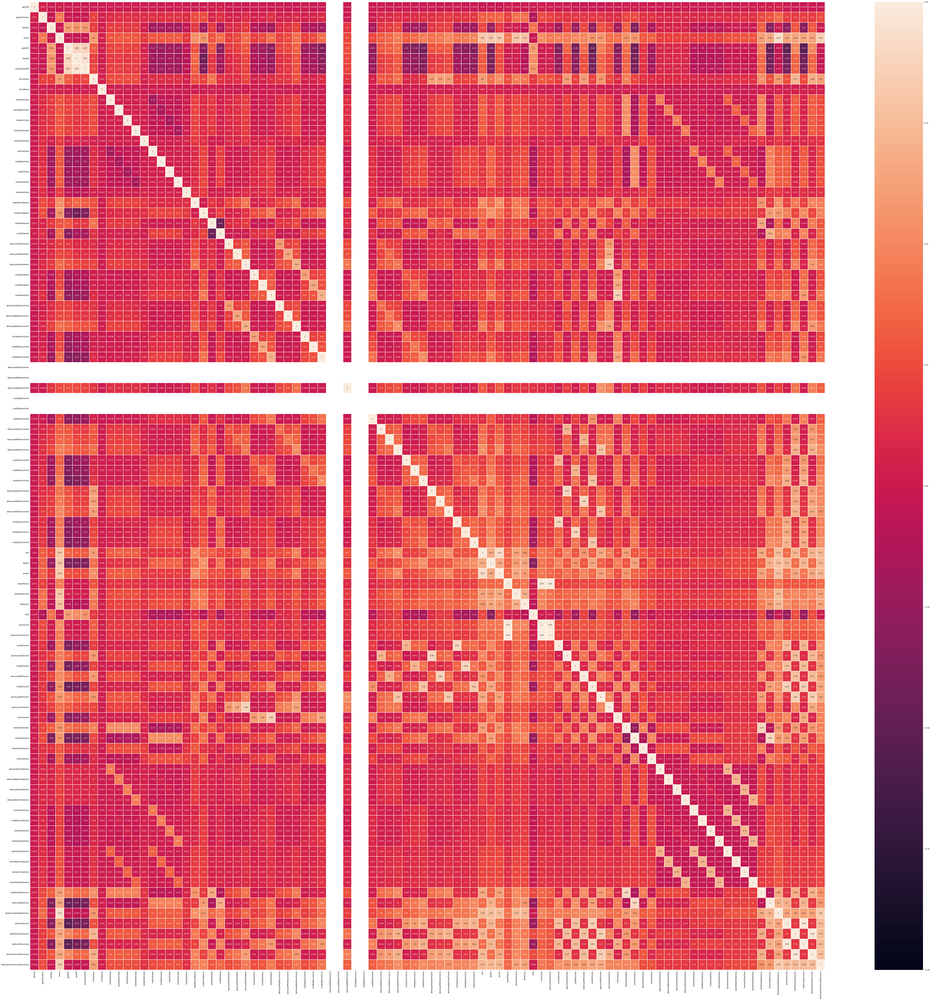

In [38]:
#All game time
corrAT=df.corr()
plt.figure(figsize=(100,100))
ax=sns.heatmap(corrAT,annot=True,linewidth=2,vmin=-1.0,vmax=1.0)

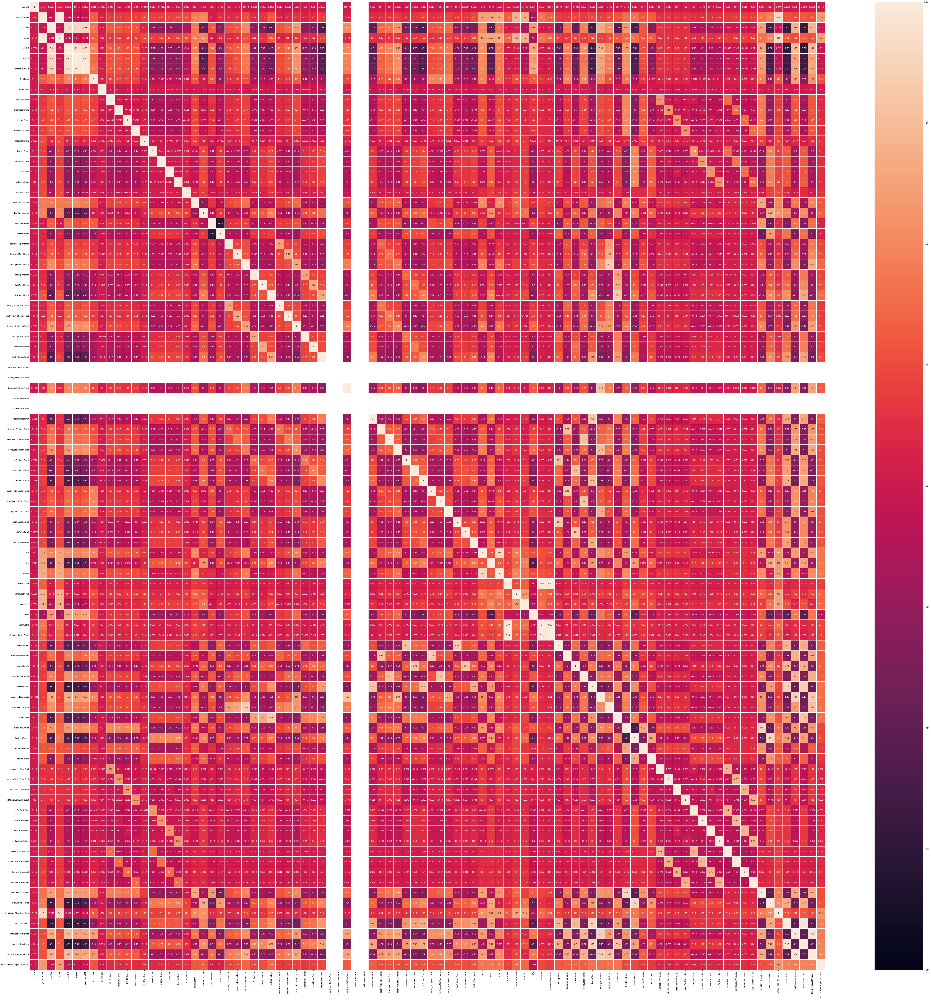

In [39]:
#End game time
corrFG=finishedGame_df.corr()
plt.figure(figsize=(100,100))
ax=sns.heatmap(corrFG,annot=True,linewidth=2,vmin=-1.0,vmax=1.0)

In [40]:
corrFG

,gameId,gameDuration,hasWon,frame,goldDiff,expDiff,champLevelDiff,isFirstTower,isFirstBlood,killedFireDrake,...,GameAirDrakeSoul,GameEarthDrakeSoul,totalKilledObjectives,totalLostObjectives,totalGameKilledObjectives,totalLostTurrets,totalDestroyedTurrets,totalLostStructures,totalDestroyedStructures,totalGameDestroyedStructures
gameId,1.000000,0.059931,0.006712,0.059058,0.005772,0.005521,0.006243,0.011423,0.009453,0.022003,...,0.015565,0.020179,0.046711,0.025907,0.073860,-0.005639,0.006441,-0.004494,0.008489,0.004065
gameDuration,0.059931,1.000000,-0.030142,0.995908,-0.034364,-0.040018,-0.031529,0.316165,0.062921,0.171889,...,0.189641,0.188793,0.411269,0.464014,0.896379,0.274683,0.239435,0.301392,0.265677,0.584161
hasWon,0.006712,-0.030142,1.000000,-0.031334,0.899919,0.884850,0.876431,0.414296,0.025520,0.299475,...,-0.008097,-0.021416,0.624154,-0.642707,-0.044529,-0.704795,0.693904,-0.724162,0.714186,-0.015694
frame,0.059058,0.995908,-0.031334,1.000000,-0.035119,-0.041137,-0.032587,0.314452,0.062121,0.171171,...,0.190167,0.188745,0.409635,0.463932,0.894654,0.284304,0.247789,0.311520,0.274550,0.603735
goldDiff,0.005772,-0.034364,0.899919,-0.035119,1.000000,0.924841,0.933856,0.489925,0.026585,0.302329,...,-0.005105,-0.019791,0.651685,-0.673276,-0.048809,-0.764559,0.750206,-0.767785,0.755239,-0.018660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
totalLostTurrets,-0.005639,0.274683,-0.704795,0.284304,-0.764559,-0.649208,-0.672446,-0.302340,-0.007018,-0.196858,...,0.058752,0.065869,-0.413968,0.665479,0.279040,1.000000,-0.520792,0.967106,-0.524316,0.461650
totalDestroyedTurrets,0.006441,0.239435,0.693904,0.247789,0.750206,0.631773,0.657141,0.614120,0.036447,0.290797,...,0.051554,0.042438,0.650990,-0.416552,0.218271,-0.520792,1.000000,-0.522552,0.964562,0.449625
totalLostStructures,-0.004494,0.301392,-0.724162,0.311520,-0.767785,-0.654815,-0.670585,-0.293210,-0.004568,-0.199834,...,0.063523,0.069095,-0.414012,0.689033,0.303563,0.967106,-0.522552,1.000000,-0.528635,0.491220
totalDestroyedStructures,0.008489,0.265677,0.714186,0.274550,0.755239,0.638046,0.657177,0.567135,0.033769,0.299576,...,0.056272,0.041267,0.676394,-0.417934,0.242303,-0.524316,0.964562,-0.528635,1.000000,0.479702


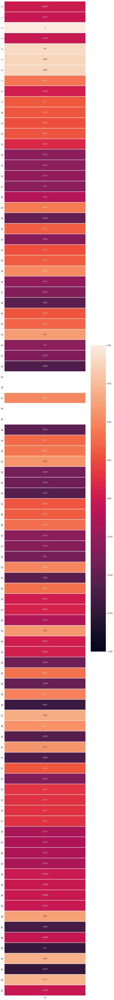

In [41]:
#End game time
plt.figure(figsize=(10,100))
corrFGhW=np.array(corrFG["hasWon"]).reshape(len(corrFG["hasWon"]),1)
ax=sns.heatmap(corrFGhW,annot=True,linewidth=2,vmin=-1.0,vmax=1.0)

Si ens fixem en el dataset original i el comparem amb el que conté els moment final de les partides ens trobem que les correlacions de molts atributs milloren quan només prenem el moment final de cada partida. S'ha de tenir en compte que aquest dataset esta format per series temporals i potser s'hauria de fer un treball d'afegir atributs que ens indiquin variances, quartils, mitjanes i altres caracteristiques dels atributs per millorar els resultats de la classificació. Tot i així amb els bons resultats que ens donen les correlacions es probable que no faci falta.

Observació: Hi ha columnes i files en blanc, aixó es perque son atributs que només tenen zeros.

## Conclusions

Pel que hem vist el principal objectiu ha de ser obtenir or i experiencia, ja que a priori hem vist que aquests son els que donen més clarament una victoria o derrota. Aixó es pot aconseguir aconseguint destruint estructures enemigues i objectius, i també evitant que l'enemic pugui aconseguir-ho. A més a més a part del valor d'or dels objectius aquests també donen pasives i augments d'estadistiques, que això indirectament es or gratis ja que sense necesitat de comprar objectes estem augmentant les estadistiques. També es important tenir un KDA alt com equip per així augmentar la diferencia d'or i d'experiencia, ja que quan mors passes una estona esperant a reviure el que dona aventatge numeric a l'enemic per jugar més tranquil i poder seguir augmentant o reduint la diferencia d'or i experiencia. 

Per tant per molt que sembli obvi, es així la millor manera de guanyar es augmentar la diferencia d'or i experiencia entre els dos equips i jugar al voltant d'assegurar estructures, objectius i kills.